In [ ]:
!pip install kornia  kornia-rs rasterio kornia_moons opencv-python --upgrade

### Import Libraries

In [ ]:
import os
import cv2
import numpy as np
import torch
import kornia as K
import kornia.feature as KF
from kornia.feature import LoFTR
import rasterio
from rasterio.plot import reshape_as_raster, reshape_as_image
import matplotlib.pyplot as plt
from typing import List
from kornia_moons.viz import draw_LAF_matches

### Dataset Loader

In [ ]:
class Sentinel2ImageLoader:
    def __init__(self, base_dir: str, max_dimension: int = 1024):
        self.base_dir = base_dir
        self.max_dimension = max_dimension
        self.image_files = self._find_image_files()

    def _find_image_files(self) -> List[str]:
        return [
            os.path.join(root, file)
            for root, _, files in os.walk(self.base_dir)
            for file in files
            if file.endswith('TCI.jp2')
        ]

    def __iter__(self):
        for image_file in self.image_files:
            print("---------------------")
            print(image_file)
            yield self._load_image_rasterio(image_file)

    def _load_image_rasterio(self, image_path: str) -> np.ndarray:
        with rasterio.open(image_path, "r", driver='JP2OpenJPEG') as src:
            raster_image = src.read()  # Shape: (bands, height, width)
        return self._resize_image(raster_image)

    def _resize_image(self, img: np.ndarray) -> np.ndarray:
        img = reshape_as_image(img)
        height, width = img.shape[:2]
        scale = self.max_dimension / max(height, width)
        new_height, new_width = int(height * scale), int(width * scale)
        resized_img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_AREA)
        return resized_img

    def load_all_images(self) -> List[np.ndarray]:
        return [img for img in self]

In [ ]:
loader = Sentinel2ImageLoader("/kaggle/input/deforestation-in-ukraine")

In [ ]:
max_images = 14
images = []
for i, img in enumerate(loader):
    print(img.shape)
    if i >= max_images:
        break
    images.append(img)

### Displaing images from dataset

In [ ]:
def show_images(images, num_images=5, images_per_row=3, figsize=(15, 15)):
    """Display images using Matplotlib in multiple rows with adjustable figure size."""
    num_rows = (num_images + images_per_row - 1) // images_per_row
    plt.figure(figsize=figsize)
    for i in range(min(num_images, len(images))):
        plt.subplot(num_rows, images_per_row, i + 1)
        plt.imshow(images[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()


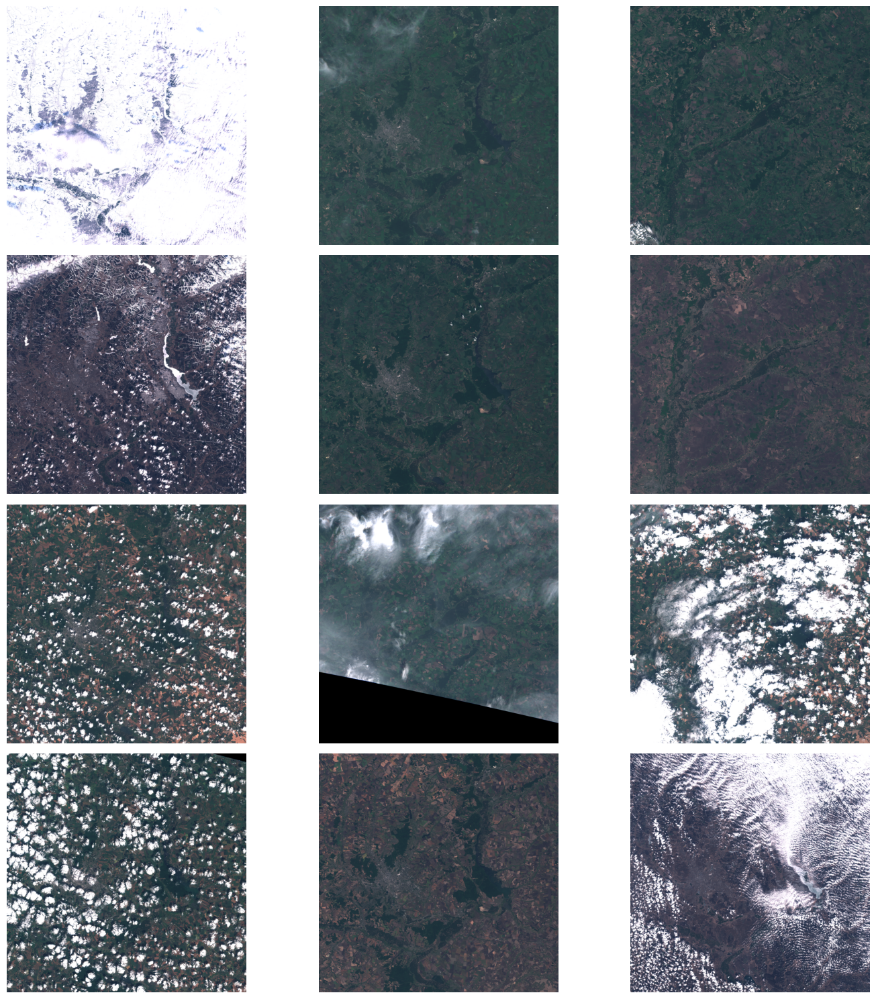

In [ ]:
show_images(images, num_images=12)

In [ ]:
# Ensure you have at least two images to match
if len(images) < 2:
    raise ValueError("At least two images are required for matching.")

### Preprocessing images

In [ ]:
def image_to_tensor(img: np.ndarray) -> torch.Tensor:
    image = K.utils.image_to_tensor(img)
    image = image.float().unsqueeze(dim=0) / 255.0
    return image

### Loading model

In [ ]:
# Initialize LoFTR with a pre-trained model
loftr = LoFTR(pretrained='outdoor')

Downloading: "http://cmp.felk.cvut.cz/~mishkdmy/models/loftr_outdoor.ckpt" to /root/.cache/torch/hub/checkpoints/loftr_outdoor.ckpt
100%|██████████| 44.2M/44.2M [00:02<00:00, 16.2MB/s]


### Visualize results

In [ ]:
def process_and_visualize_matching(img1: np.ndarray, img2: np.ndarray, model) -> None:
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    img1_tensor = image_to_tensor(img1).to(device)
    img2_tensor = image_to_tensor(img2).to(device)
    input_dict = {
        "image0": K.color.rgb_to_grayscale(img1_tensor),
        "image1": K.color.rgb_to_grayscale(img2_tensor),
    }

    with torch.no_grad():
        correspondences = model({k: v.to(device) for k, v in input_dict.items()})

    mkpts0 = correspondences["keypoints0"].cpu().numpy()
    mkpts1 = correspondences["keypoints1"].cpu().numpy()
    Fm, inliers = cv2.findFundamentalMat(mkpts0, mkpts1, cv2.USAC_MAGSAC, 0.5, 0.999, 100000)
    inliers = inliers > 0

    draw_LAF_matches(
        K.feature.laf_from_center_scale_ori(
            torch.from_numpy(mkpts0).view(1, -1, 2),
            torch.ones(mkpts0.shape[0]).view(1, -1, 1, 1),
            torch.ones(mkpts0.shape[0]).view(1, -1, 1),
        ),
        K.feature.laf_from_center_scale_ori(
            torch.from_numpy(mkpts1).view(1, -1, 2),
            torch.ones(mkpts1.shape[0]).view(1, -1, 1, 1),
            torch.ones(mkpts1.shape[0]).view(1, -1, 1),
        ),
        torch.arange(mkpts0.shape[0]).view(-1, 1).repeat(1, 2),
        K.tensor_to_image(img1_tensor),
        K.tensor_to_image(img2_tensor),
        inliers,
        draw_dict={
            "inlier_color": (0.1, 1, 0.1, 0.5),
            "tentative_color": None,
            "feature_color": (0.2, 0.2, 1, 0.5),
            "vertical": False,
        },
    )


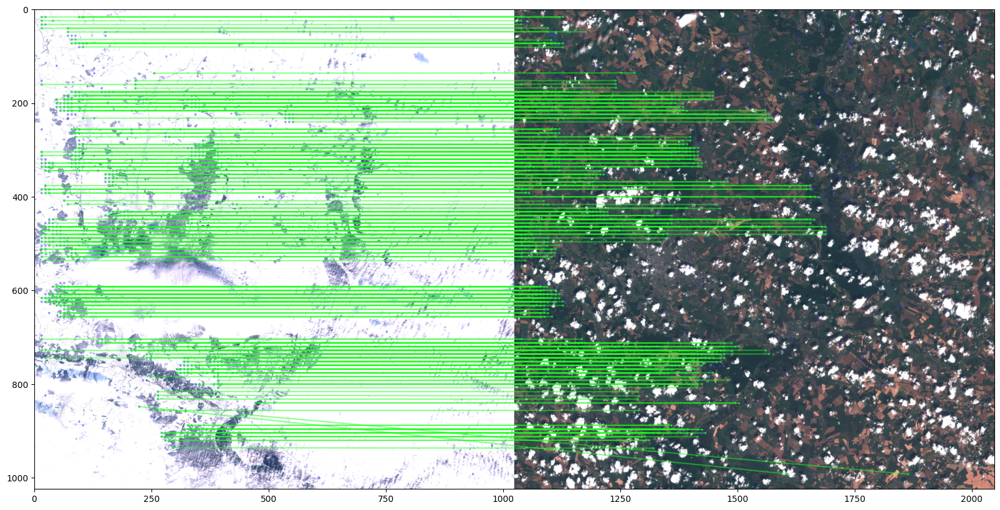

In [ ]:
process_and_visualize_matching(images[0], images[6], loftr)

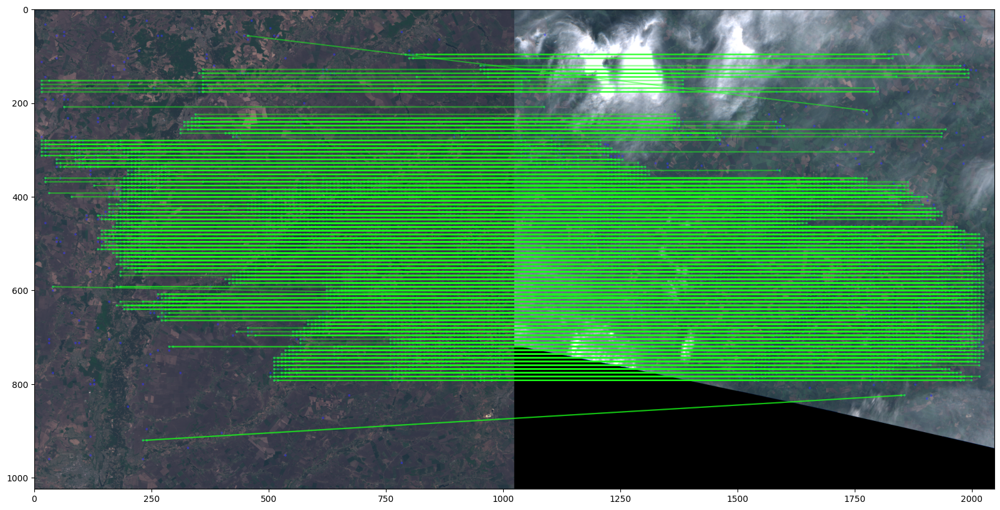

In [ ]:
process_and_visualize_matching(images[5], images[7], loftr)

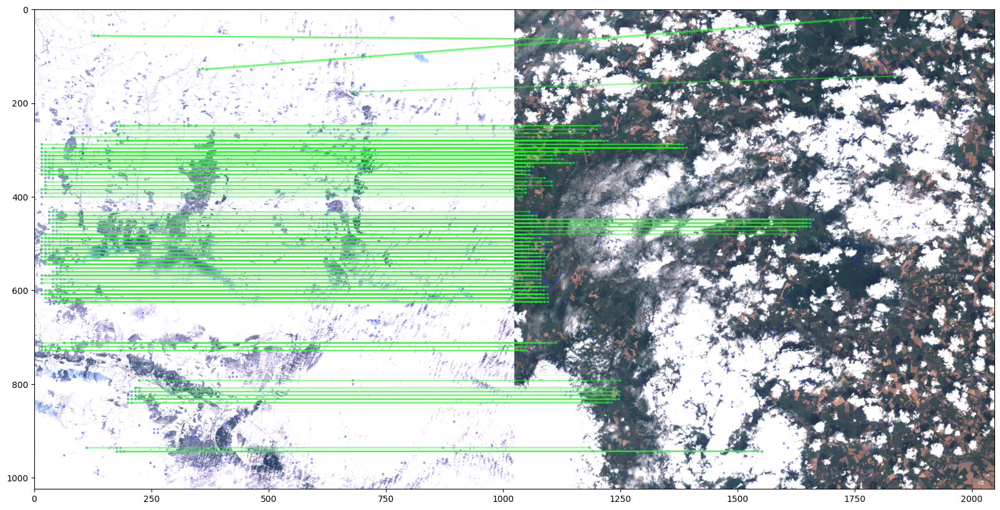

In [ ]:
process_and_visualize_matching(images[0], images[8], loftr)

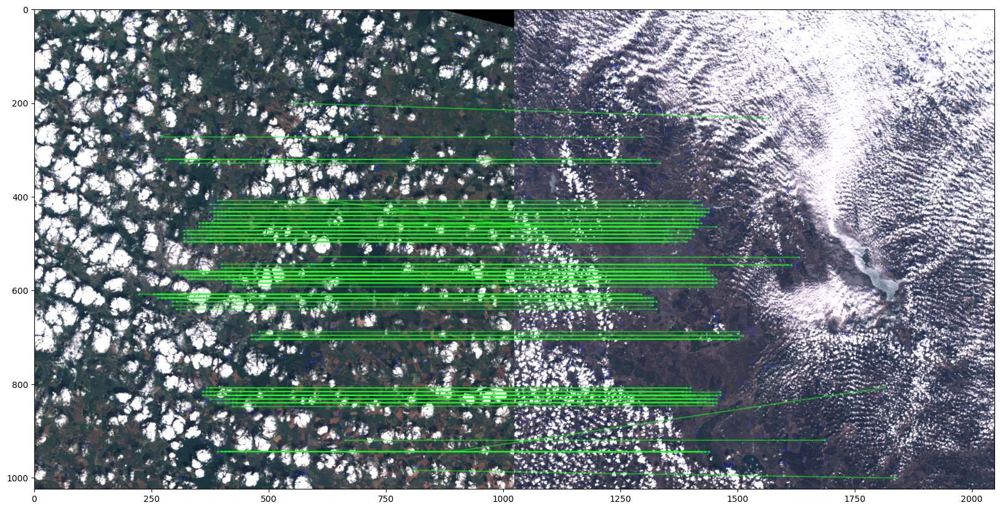

In [ ]:
process_and_visualize_matching(images[9], images[11], loftr)